## Inference

In [14]:
import xml.etree.ElementTree as ET

xml_string = '''
<View>
    <View style="display:flex;align-items:start;gap:8px;flex-direction:row"><Image name="image" value="$ocr"/><Labels name="label" toName="image" showInline="false">
    <Label value="Rechnungsnummer" background="#0B3616" hotkey="1"/><Label value="Kundennummer" background="#2B1B54" hotkey="2"/><Label value="Bescheiddatum" background="#73876D" hotkey="3"/><Label value="Anrede_RE" background="#E21038" hotkey="4"/><Label value="Vorname_RE" background="#56998D" hotkey="5"/><Label value="Nachname_RE" background="#98BC38" hotkey="6"/><Label value="Unternehmensname_RE" background="#B0D031" hotkey="7"/><Label value="Straße_RE" background="#A48ABE" hotkey="8"/><Label value="Hausnummer_RE" background="#7479CC" hotkey="9"/><Label value="PLZ_RE" background="#91E1B7" hotkey="0"/><Label value="Ort_RE" background="#B892E8" hotkey="q"/><Label value="Land_RE" background="#04AC09" hotkey="w"/><Label value="Anrede_LE" background="#B6D797" hotkey="e"/><Label value="Vorname_LE" background="#5C24D8" hotkey="r"/><Label value="Nachname_LE" background="#EDFD22" hotkey="t"/><Label value="Unternehmensname_LE" background="#D53BB1" hotkey="y"/><Label value="Straße_LE" background="#68ADD2" hotkey="u"/><Label value="Hausnummer_LE" background="#47F672" hotkey="i"/><Label value="PLZ_LE" background="#DF11D9" hotkey="o"/><Label value="Ort_LE" background="#5C6B46" hotkey="p"/><Label value="Land_LE" background="#DD9A74" hotkey="a"/><Label value="Anreise" background="#70D81B" hotkey="s"/><Label value="Abreise" background="#C3600E" hotkey="d"/><Label value="Datum" background="#14DF20" hotkey="f"/><Label value="MwSt_Prozentsatz" background="#982885" hotkey="g"/><Label value="MwSt_Betrag" background="#A3BF70" hotkey="h"/><Label value="Beschreibung" background="#7B4ADA" hotkey="j"/><Label value="Anzahl" background="#D744E0" hotkey="k"/><Label value="Einheit" background="#4D96F1" hotkey="l"/><Label value="Einzelpreis" background="#51D042" hotkey="z"/><Label value="Gesamtpreis" background="#1ACB48" hotkey="x"/><Label value="Position" background="#72E35F" hotkey="c"/><Label value="Nettobetrag" background="#68F94D" hotkey="v"/><Label value="Bruttobetrag" background="#49D30A" hotkey="b"/><Label value="Rabatt" background="#4592B8" hotkey="n"/><Label value="IBAN" background="#95FD27" hotkey="m"/><Label value="BIC" background="#B7E9D1" hotkey="Shift+1"/><Label value="Steuernummer" background="#D96E7B" hotkey="Shift+2"/>
            <Label value="No Entity" background="#ffffff"/>  
        </Labels>
    </View>

    <Rectangle name="bbox" toName="image" fillColor="white" strokeWidth="0" opacity="0" strokeColor="white"/>
    <Polygon name="poly" toName="image" fillColor="white" strokeWidth="0" opacity="0" strokeColor="white"/>

    <TextArea name="transcription" toName="image" editable="true" perRegion="true" required="true" maxSubmissions="1" rows="5" placeholder="Recognized Text" displayMode="region-list"/>
    </View>
'''

id2label = {}
label2id = {}

# Parse the XML string
root = ET.fromstring(xml_string)

# Find the Labels element
labels_element = root.find(".//Labels")

# Extract Label values
label_values = [label.attrib["value"] for label in labels_element.findall(".//Label")]

# Add No Entity
label_values.insert(0, "No Entity")
label_values.pop(39)

id2label = {id:label for id, label in enumerate(label_values)}
label2id = {label:id for id, label in enumerate(label_values)}

In [15]:
from utils.util import convert_pdf_to_images
from PIL import Image, ImageDraw, ImageFont
from transformers import LayoutLMv3FeatureExtractor, LayoutLMv3TokenizerFast, LayoutLMv3Processor, LiltForTokenClassification
import pytesseract
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"
from net.model import LiLT

tokenizer_id = "xlm-roberta-base"
tokenizer = LayoutLMv3TokenizerFast.from_pretrained(tokenizer_id)
feature_extractor = LayoutLMv3FeatureExtractor(apply_ocr=True)
processor = LayoutLMv3Processor(feature_extractor, tokenizer)


model_id = "nielsr/lilt-xlm-roberta-base"
ckpt_path = "out/ner_hotel/ner_hotel/version_3/checkpoints/epoch=52-overall_f1_validation=0.39.ckpt"
# ckpt_path = "out/ner_hotel/ner_hotel/version_7/checkpoints/epoch=34-overall_f1_validation=0.53.ckpt"
ner = LiltForTokenClassification.from_pretrained(model_id, label2id=label2id, id2label=id2label, num_labels=len(label_values))
model = LiLT.load_from_checkpoint(checkpoint_path=ckpt_path, net=ner, train_dataloader=None, processor=None)

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'XLMRobertaTokenizerFast'. 
The class this function is called from is 'LayoutLMv3TokenizerFast'.
Some weights of LiltForTokenClassification were not initialized from the model checkpoint at nielsr/lilt-xlm-roberta-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


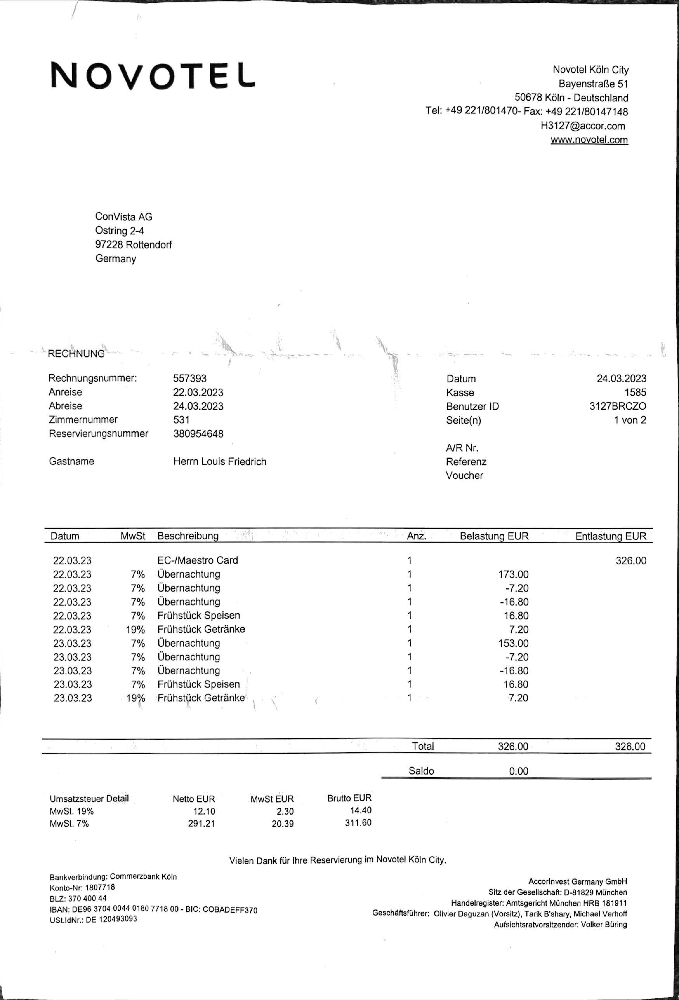

In [16]:
# path = "../data/benchmarking/training/docs/230421_hotel_feu.pdf"
# path = "../data/benchmarking/training/docs/decr_Rechnung_Hotel_231209.pdf"
# path = "../data/benchmarking/training/docs/IMG_3997_processed_2.pdf"
path = "../data/benchmarking/training/docs/IMG_0194.pdf"
image = convert_pdf_to_images(path)[0]
image

In [17]:
encoding = processor(image, return_offsets_mapping=True, return_tensors="pt")
offset_mapping = encoding.pop('offset_mapping')
encoding.pop('pixel_values')
print(encoding.keys())

dict_keys(['input_ids', 'attention_mask', 'bbox'])


In [18]:
for k,v in encoding.items():
    print(k, v.shape)

input_ids torch.Size([1, 467])
attention_mask torch.Size([1, 467])
bbox torch.Size([1, 467, 4])


In [19]:
for k,v in encoding.items():
  encoding[k] = v.to('cuda')

In [20]:
encoding.keys()

dict_keys(['input_ids', 'attention_mask', 'bbox'])

In [21]:
# forward pass
outputs = model.model(**encoding)
print(outputs.logits.shape)

torch.Size([1, 467, 39])


Let's create the true predictions as well as the true boxes. With "true", I mean only taking into account tokens that are at the start of a given word. We can use the `offset_mapping` returned by the processor to determine which tokens are a subword.

In [22]:
def unnormalize_box(bbox, width, height):
     return [
         width * (bbox[0] / 1000),
         height * (bbox[1] / 1000),
         width * (bbox[2] / 1000),
         height * (bbox[3] / 1000),
     ]

predictions = outputs.logits.argmax(-1).squeeze().tolist()
token_boxes = encoding.bbox.squeeze().tolist()

width, height = image.size

In [23]:
import numpy as np

is_subword = np.array(offset_mapping.squeeze().tolist())[:,0] != 0

true_predictions = [id2label[pred] for idx, pred in enumerate(predictions) if not is_subword[idx]]
true_boxes = [unnormalize_box(box, width, height) for idx, box in enumerate(token_boxes) if not is_subword[idx]]

Viz

In [25]:
true_predictions

['No Entity',
 'Unternehmensname_LE',
 'Unternehmensname_LE',
 'Unternehmensname_LE',
 'Straße_LE',
 'Hausnummer_LE',
 'PLZ_LE',
 'Ort_LE',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'Unternehmensname_RE',
 'Unternehmensname_RE',
 'Straße_RE',
 'Hausnummer_RE',
 'PLZ_RE',
 'Ort_RE',
 'Land_RE',
 'No Entity',
 'No Entity',
 'Rechnungsnummer',
 'No Entity',
 'Bescheiddatum',
 'No Entity',
 'Anreise',
 'No Entity',
 'No Entity',
 'No Entity',
 'Abreise',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'Anrede_RE',
 'Vorname_RE',
 'Nachname_RE',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'No Entity',
 'Einheit',
 'No Entity',
 'Einheit',
 'Datum',
 'Beschreibung',
 'Beschreibung',
 'Anzahl',


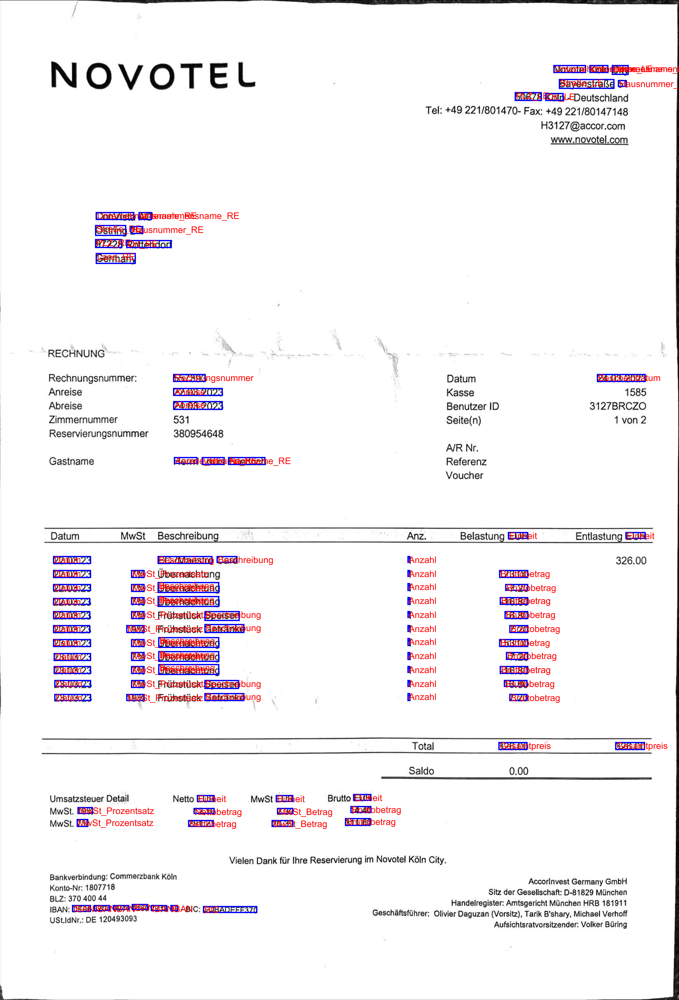

In [26]:
from PIL import ImageDraw

draw = ImageDraw.Draw(image)

# ont = ImageFont.load_default()
font = ImageFont.truetype("arial.ttf", 70)

for prediction, box in zip(true_predictions, true_boxes):
    if prediction == "No Entity": continue
    predicted_label = prediction
    draw.rectangle(box, outline='blue', width=10)
    draw.text((box[0]+10, box[1]-10), text=predicted_label, fill='red', font=font)

image
